# 1 Datos y contexto

Análisis de un set de datos consistente de **la temporalidad del consumo de energía ** a lo largo de varios años.

Se dispone de un set de datos que inicia el ***12/31/2002 - 1:00:00 AM*** y finaliza ***1/2/2016 - 12:00:00 AM***, diponemos de:


- La columna ***Datetime*** que nos muestra la fecha y hora,
- La columna ***Energy*** que nos muestra la demanda de electricidad en (MW).


El objetivo es predecir un año y medio más (del 01 de julio de 2016 hasta el 31 de diciembre de 2018) de estos consumos. Vamos a utilizar la librería Skforecast para efectuar las predicciones.

In [3]:
 # Intalación de Librerías necesarias
 !pip install skforecast
 !pip install lightgbm
 !pip install shap

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 670.5/670.5 kB 14.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 362.8/362.8 kB 18.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.5/233.5 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 2.4 MB/s eta 0:00:00


In [4]:
# Librerías
import pandas as pd
import numpy as np
from skforecast.datasets import fetch_dataset
import skforecast
import lightgbm
import sklearn
from lightgbm import LGBMRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.feature_selection import RFECV
from skforecast.ForecasterBaseline import ForecasterEquivalentDate
from skforecast.ForecasterAutoreg import ForecasterAutoreg
from skforecast.ForecasterAutoregDirect import ForecasterAutoregDirect
from skforecast.model_selection import bayesian_search_forecaster
from skforecast.model_selection import backtesting_forecaster
from skforecast.model_selection import select_features
import shap

from skforecast.model_selection import grid_search_forecaster
from skforecast.model_selection import backtesting_forecaster
from sklearn.linear_model import Ridge
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer
import shap

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


In [69]:
# Leemos los datos proporcionados
df_energy = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Machine Learning 2/data/energy_train.csv')
df_energy.head(5)

,Datetime,Energy
0,2002-12-31 01:00:00,5077.0
1,2002-12-31 02:00:00,4939.0
2,2002-12-31 03:00:00,4885.0
3,2002-12-31 04:00:00,4857.0
4,2002-12-31 05:00:00,4930.0


# 2 EDA (Exploratory Data Analysis)

El análisis exploratorio de los datos nos permite enteder e identificar los problemas más comunes que pueden aparecer en los sets de datos de series temporales.

Algúnosde los problemas más comunes son:

- El formato del timestamp.
- Los valores faltantes entre diferentes intervalos temporales(interpolación)
- Los outliers.



## 2.1 Análisis básico

In [ ]:
df_energy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 124870 entries, 0 to 124869
Data columns (total 2 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   Datetime  124870 non-null  object 
 1   Energy    124870 non-null  float64
dtypes: float64(1), object(1)
memory usage: 1.9+ MB


In [ ]:
df_energy.describe()

,Energy
count,124870.000000
mean,5598.508177
std,975.696271
min,487.000000
25%,4906.000000
50%,5534.000000
75%,6250.000000
max,9594.000000


Observamos que la columna ***Datetime*** no esta bien tipificada, por lo tanto la tipificamos en formato datetime de pandas empleando la función pd.to_datetime().

 Una vez en formato datetime, para hacer uso de las funcionalidades de pandas, se establece como índice.


In [ ]:
# Conversión del formato fecha y se establece como índice
df_energy['Datetime'] = pd.to_datetime(df_energy['Datetime'], format='%Y-%m-%d %H:%M:%S')
df_energy = df_energy.set_index('Datetime')

## 2.2 Duplicados

Vemos si hay fechas duplicados en la serie temporal, en caso de heberlos le imputamos la media ente los registros duplicados.

In [ ]:
# Ver duplicaos
duplicates = df_energy[df_energy.index.duplicated(keep=False)]
duplicates

,Energy
Datetime,
2014-11-02 02:00:00,4613.0
2014-11-02 02:00:00,4571.0
2015-11-01 02:00:00,3927.0
2015-11-01 02:00:00,3832.0


In [ ]:
df_energy = df_energy.groupby(df_energy.index).mean()  # imputamos la media

Dado que los datos se han registrado cada  hora se indica la frecuencia '1h'.

In [ ]:
# Asignamos frecuencia
df_energy = df_energy.asfreq('1h')
df_energy = df_energy.sort_index()
df_energy.head(5)

,Energy
Datetime,
2002-04-01 01:00:00,4374.0
2002-04-01 02:00:00,4306.0
2002-04-01 03:00:00,4322.0
2002-04-01 04:00:00,4359.0
2002-04-01 05:00:00,4436.0


## 2.3 Verificar si la serie está completa y nulos

Vamos a verificar si la serie está completa y si hay nulos:

In [ ]:
# Verificar que un índice temporal está completo

fecha_inicio = df_energy.index.min()
fecha_fin = df_energy.index.max()
date_range_completo = pd.date_range(start=fecha_inicio, end=fecha_fin, freq=df_energy.index.freq)
print(f"Índice completo: {(df_energy.index == date_range_completo).all()}")

Índice completo: True


Efectivamente la serie temporal esta completa en cuanto a las fechas. Vamo a ver los nulos:

In [ ]:
nulos =  df_energy[df_energy.isnull().any(axis=1)]
num_nulos = len(nulos)
print(f"Filas con valores ausentes: {num_nulos}")
nulos.head(5)

Filas con valores ausentes: 28


,Energy
Datetime,
2002-04-07 03:00:00,NaN
2002-10-27 02:00:00,NaN
2003-04-06 03:00:00,NaN
2003-10-26 02:00:00,NaN
2004-04-04 03:00:00,NaN


In [ ]:
null_dates = df_energy.index[df_energy['Energy'].isnull()]
null_dates

DatetimeIndex(['2002-04-07 03:00:00', '2002-10-27 02:00:00',
               '2003-04-06 03:00:00', '2003-10-26 02:00:00',
               '2004-04-04 03:00:00', '2004-10-31 02:00:00',
               '2005-04-03 03:00:00', '2005-10-30 02:00:00',
               '2006-04-02 03:00:00', '2006-10-29 02:00:00',
               '2007-03-11 03:00:00', '2007-11-04 02:00:00',
               '2008-03-09 03:00:00', '2008-11-02 02:00:00',
               '2009-03-08 03:00:00', '2009-11-01 02:00:00',
               '2010-03-14 03:00:00', '2010-11-07 02:00:00',
               '2010-12-10 00:00:00', '2011-03-13 03:00:00',
               '2011-11-06 02:00:00', '2012-03-11 03:00:00',
               '2012-11-04 02:00:00', '2013-03-10 03:00:00',
               '2013-11-03 02:00:00', '2014-03-09 03:00:00',
               '2015-03-08 03:00:00', '2016-03-13 03:00:00'],
              dtype='datetime64[ns]', name='Datetime', freq=None)

In [ ]:
import plotly.graph_objects as go

# Crear una máscara para identificar los puntos nulos
null_data = df_energy[df_energy['Energy'].isnull()]

# Crear el gráfico de los puntos nulos
fig = go.Figure()

# Añadir solo los puntos nulos como marcadores rojos
fig.add_trace(go.Scatter(
    x=null_data.index,
    y=[0] * len(null_data),  # Puedes colocar ceros o dejar en None para enfatizar que no hay valores
    mode='markers',
    marker=dict(color='red', size=8, symbol='x'),
    name='Períodos sin Datos'
))

# Configuración del diseño
fig.update_layout(
    title='Períodos sin Datos en la Serie Temporal',
    xaxis_title='Fecha',
    yaxis=dict(title='Indicación de Falta de Datos', showticklabels=False),  # Oculta etiquetas en Y
    hovermode='x unified',
    template='plotly_white'
)

# Mostrar el gráfico interactivo
fig.show()


Hay 28 registros ***NaN***  lo que significa que ***NO***  hay registros de consumo energético esos días.

## 2.4 Imputación de valores faltantes

Como hay 28 registros ***NaN***  lo que significa que ***NO***  hay registros de consumo energético esos días.

Lo que nos sugiere que debemos utilizar métodos de imputación de los nulos teniendo muy en cuenta que es imporante conservar la consisténcia de los datos, ***ya que la secuencia de los datos es relevante***, la alteración del orden puede causar graves consecuencias en nuestras predicciones.

Hemos decidido aplicar las siguiente estratégia:


- ***Interpolación lineal***


Consideramos que esta es la mejor estrategia para tratar los valores nulos en nuestro conjunto de datos. Ya que contamos con una serie temporal que abarca desde 2002 hasta 2016, con intervalos horarios, lo que nos proporciona una gran cantidad de registros. Dado este amplio rango temporal, es menos probable que ocurran cambios bruscos entre cada registro del consumo.


Además los datos nulos estan distanciados en uno con el otro (como podemos ver en la gráfica anterior).


Sin embargo, la calidad de las imputaciones con ***Interpolación lineal*** puede no ser buena, lo que perjudica el entrenamiento del modelo. Una forma de mejorar la estrategia de imputación es combinarla con la asiganción de pesos. Esta última consiste en reducir el peso de las observaciones imputadas y, por tanto, su influencia durante el entrenamiento del modelo.




In [ ]:
# Imputación de valores mediante interpolación lineal (calcula una línea recta entre los puntos existentes y estima los valores intermedios.)
import sklearn
df_energy['Energy'] = df_energy['Energy'].interpolate(method='linear')

In [ ]:
nulos_data =  df_energy[df_energy.isnull().any(axis=1)]
num_nulos = len(nulos_data)
print(f"Filas con valores ausentes: {num_nulos}")

Filas con valores ausentes: 0


## 2.5 Valores atípicos

### Visualización de los datos para detectar outliers

<ipython-input-17-08e53a8b3b8e>:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




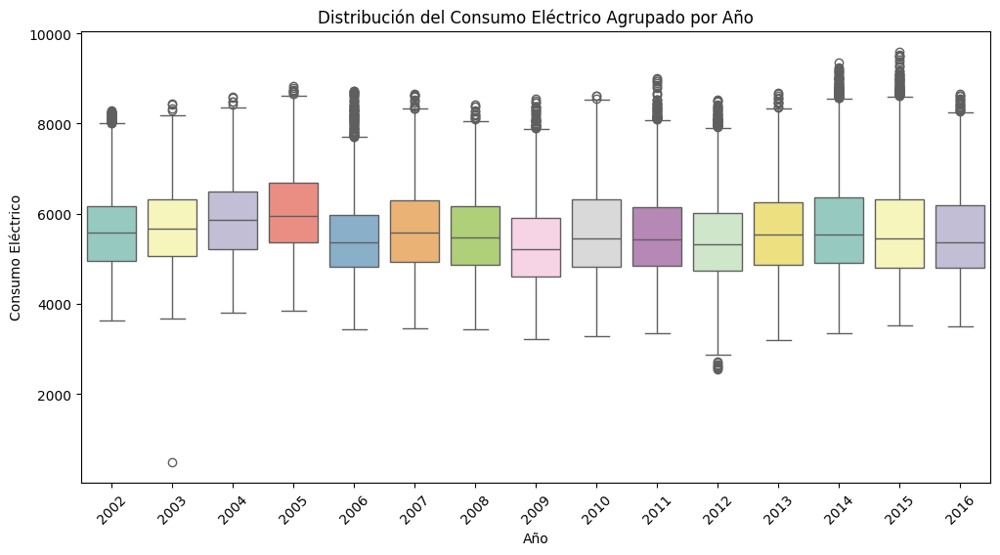

In [ ]:
# Distribuación anual
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# copia para no sobreescribir el df
df_energy_copy = df_energy.copy()

# Extraer el año de la columna de fecha
df_energy_copy['Year'] = df_energy_copy.index.year

# Crear el gráfico de distribución usando boxplot para cada año
plt.figure(figsize=(12, 6))
sns.boxplot(x='Year', y='Energy', data=df_energy_copy, palette="Set3")

# Configurar el gráfico
plt.title('Distribución del Consumo Eléctrico Agrupado por Año')
plt.xlabel('Año')
plt.ylabel('Consumo Eléctrico')
plt.xticks(rotation=45)  # Rotar los años para mejorar la legibilidad

# Mostrar el gráfico
plt.show()


Podemos ver que si hay preséncia de registros atípicos en los datos.

### Z-Score para detectar ouliers

El Z-Score es una técnica estadística que permite identificar valores atípicos midiendo cuántas desviaciones estándar está un valor de la media. Los valores con un Z-Score mayor a 3 o menor a -3 suelen considerarse atípicos (outliers).

In [ ]:
import pandas as pd
import numpy as np

# copiamos el df para no sobreescribir
df_energy_copy = df_energy.copy()

# Calcular la media y la desviación estándar del consumo eléctrico
mean_consumo = df_energy['Energy'].mean()
std_consumo = df_energy['Energy'].std()

# Calcular el Z-Score
df_energy_copy['z_score'] = (df_energy['Energy'] - mean_consumo) / std_consumo

# Filtrar los registros atípicos
outliers = df_energy_copy[np.abs(df_energy_copy['z_score']) > 3]
outliers


,Energy,z_score
Datetime,,
2003-05-29 00:00:00,487.0,-5.238297
2004-12-20 19:00:00,8598.0,3.074235
2004-12-20 20:00:00,8574.0,3.049639
2005-01-17 19:00:00,8561.0,3.036316
2005-01-24 13:00:00,8742.0,3.221813
...,...,...
2016-01-18 19:00:00,8666.0,3.143925
2016-01-18 20:00:00,8607.0,3.083459
2016-01-18 21:00:00,8607.0,3.083459


Vamos a graficar los outliers:

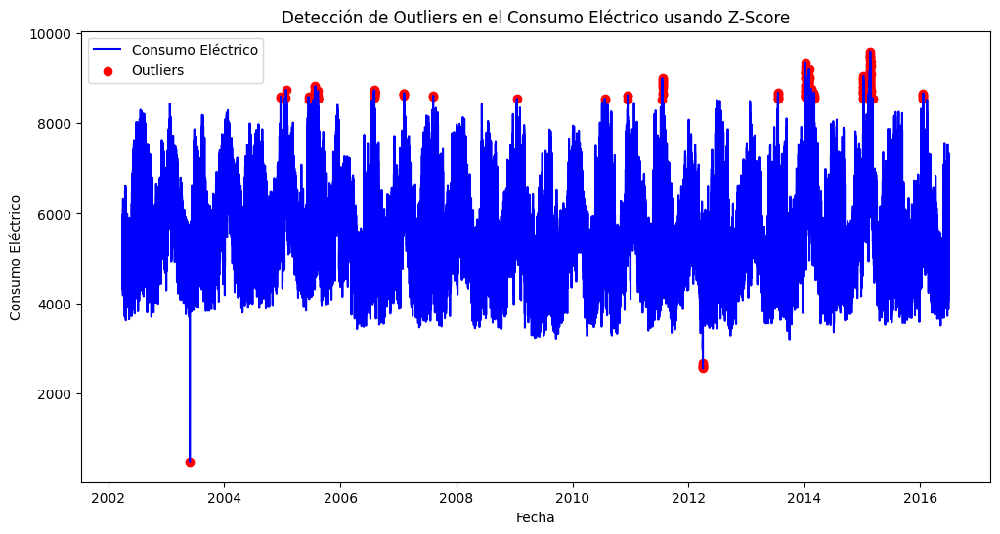

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.plot(df_energy.index, df_energy['Energy'], label='Consumo Eléctrico', color='blue')
plt.scatter(outliers.index, outliers['Energy'], color='red', label='Outliers')
plt.xlabel('Fecha')
plt.ylabel('Consumo Eléctrico')
plt.title('Detección de Outliers en el Consumo Eléctrico usando Z-Score')
plt.legend()
plt.show()


Vemos que hay 244 registros que superan el threshold marcado en el Z-Score (3 y -3), y consideramos que son pronunciados.

Esto lo identificamos de manera visual y por el Z-Score. Son registros que triplican la desviación estándar.



### Imputación de los outliers basada en modelos (DESCARTADO)

Antes de ejecutar la imputación tenemos que comprovar que relamente la serie temporal es estacionaria (lo veremos en el apartado 3). Ya que para series con estacionalidad o tendencias, podemos usar modelos como SARIMA para predecir y reemplazar outliers con ***valores más confiables***.

SARIMA consideramos que es el más adecuado para series temporales con patrones que se repiten a intervalos regulares (en nuestro caso en horas).

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
import numpy as np

# Copia del df original para no sobreescribir nada
df_energy_copy = df_energy.copy()

# Calcular el Z-Score
df_energy_copy['z_score'] = (df_energy['Energy'] - mean_consumo) / std_consumo

# Ajustar un modelo SARIMA (ajusta los parámetros a tu serie de tiempo)
# En este ejemplo, se usa (p=1, d=1, q=1) y estacionalidad (P=1, D=1, Q=1) con período s=12
model = SARIMAX(df_energy_copy['Energy'], order=(1,1,1), seasonal_order=(1,1,1,12))
model_fit = model.fit()

# Predecir valores
predicted_values = model_fit.predict()

# Reemplazar outliers con valores predichos
df_energy_copy.loc[np.abs(df_energy_copy['z_score']) > 3, 'Energy'] = predicted_values


KeyboardInterrupt: 

In [ ]:
# ARIMA (no lo utilizamos):
'''
from statsmodels.tsa.arima.model import ARIMA

# Copia del df original para no sobreescribir nada
df_energy_copy = df_energy.copy()

# Calcular el Z-Score
df_energy_copy['z_score'] = (df_energy['Energy'] - mean_consumo) / std_consumo

# Ajustar un modelo ARIMA (usa parámetros apropiados para tus datos)
model = ARIMA(df_energy_copy['Energy'], order=(1,1,1))
model_fit = model.fit()

# Reemplazar outliers con valores predichos
df_energy_copy.loc[np.abs(df_energy_copy['z_score']) > 3, 'Energy'] = model_fit.predict()
'''


In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.plot(df_energy_copy.index, df_energy_copy['Energy'], label='Consumo Eléctrico', color='blue')
#plt.scatter(outliers.index, outliers['Energy'], color='red', label='Outliers')
plt.xlabel('Fecha')
plt.ylabel('Consumo Eléctrico')
plt.title('Consumo Eléctrico outliers con valores predichos')
plt.legend()
plt.show()


### Winsorización


In [ ]:
df_energy.describe()

,Datetime,Energy
count,124870,124870.000000
mean,2009-05-16 02:16:05.544966656,5598.508177
min,2002-04-01 01:00:00,487.000000
25%,2005-10-23 01:15:00,4906.000000
50%,2009-05-16 02:30:00,5534.000000
75%,2012-12-07 03:45:00,6250.000000
max,2016-06-30 00:00:00,9594.000000
std,NaN,975.696271


In [ ]:
import numpy as np

# Copia
df_energy_winsorización = df_energy.copy()

# Definir los percentiles de winsorización
lower_percentile = 50
upper_percentile = 50

# Calcular los límites de winsorización
lower_limit = np.percentile(df_energy_winsorización['Energy'], lower_percentile)
upper_limit = np.percentile(df_energy_winsorización['Energy'], upper_percentile)

# Winsorización: reemplazar valores con z-score alto/bajo con los límites calculados
df_energy_winsorización['Energy_winsorized'] = df_energy_copy['Energy'].copy()  # Copia para no sobreescribir

# Reemplazar valores extremos
df_energy_winsorización.loc[df_energy_copy['z_score'] > 3, 'Energy_winsorized'] = upper_limit
df_energy_winsorización.loc[df_energy_copy['z_score'] < -3, 'Energy_winsorized'] = lower_limit


NameError: name 'df_energy_copy' is not defined

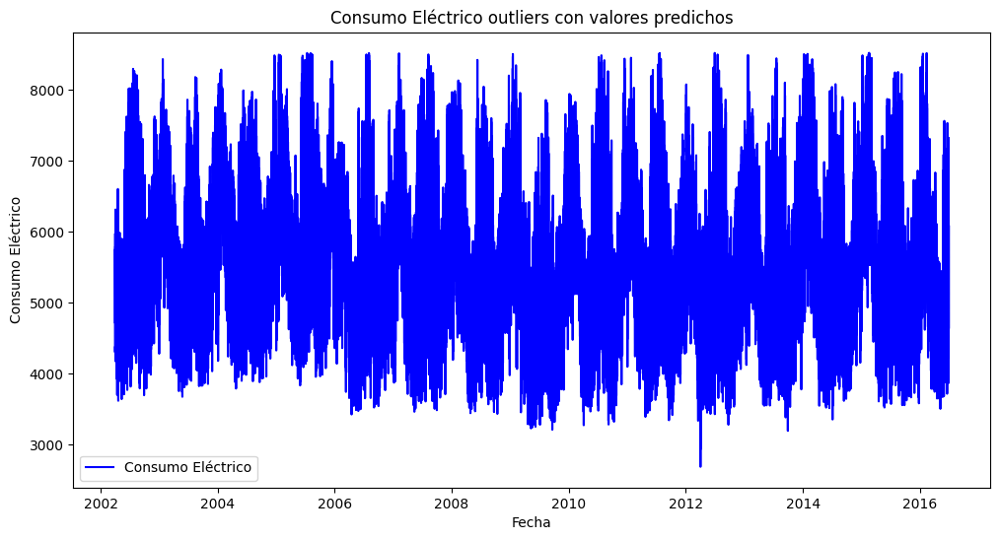

In [ ]:

import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.plot(df_energy_winsorización.index, df_energy_winsorización['Energy_winsorized'], label='Consumo Eléctrico', color='blue')
#plt.scatter(outliers.index, outliers['Energy'], color='red', label='Outliers')
plt.xlabel('Fecha')
plt.ylabel('Consumo Eléctrico')
plt.title('Consumo Eléctrico outliers con valores predichos')
plt.legend()
plt.show()

## 2.6 Variables exógenas

Variables que sería interesante incluir para mejorar la predicción del modelo:

- Festivos (nacional...)

- Estación del año

- Mes del año

- Día de la semana


## 2.7 Horas Desde el 1 de julio de 2016 hasta el 31 de diciembre de 2018

In [ ]:
from datetime import datetime

# Definir las fechas de inicio y fin
start_date = datetime(2016, 7, 1)
end_date = datetime(2018, 12, 31)

# Calcular la diferencia en horas
delta = end_date - start_date
hours = delta.total_seconds() / 3600  # Convertir segundos a horas
hours


21912.0

# 3 Análsis Estacionario

Hay que tener en cuenta que se considera una serie temporal estaconaria si sus propiedades estadísticas (media, varianza, autocorrelación) son constantes a lo largo del tiempo.

Para variables cíclicas como la hora, el día de la semana, el mes o la estación del año, se recomienda usar transformación trigonométrica. Esto es, representar las variables mediante seno y coseno para capturar su naturaleza cíclica. De esta manera, la relación entre las categorías cíclicas se mantiene intacta.


Las características cíclicas desempeñan un papel importante en la predicción de series temporales porque capturan patrones recurrentes u oscilaciones dentro de un conjunto de datos.

- **Codificación one-hot**: si la característica cíclica consta de categorías distintas, como estaciones o meses, se puede utilizar la codificación one-hot. Este enfoque crea variables binarias para cada categoría, lo que permite que el modelo comprenda la presencia o ausencia de categorías específicas. Lo utilizaremos para la estación del año.

- **Codificación trigonométrica**: para características periódicas como la hora del día o el día de la semana, se pueden utilizar funciones trigonométricas como el seno y el coseno para la codificación. Al asignar la característica cíclica a un círculo unitario, estas funciones conservan las relaciones cíclicas. Además, este método introduce solo dos características adicionales, lo que lo convierte en una técnica de codificación eficiente.

In [ ]:
# Función para determinar la estación del año
def obtener_estacion(fecha):
      if fecha.month in [12, 1, 2]:
          return 'Invierno'
      elif fecha.month in [3, 4, 5]:
          return 'Primavera'
      elif fecha.month in [6, 7, 8]:
          return 'Verano'
      else:
        return 'Otoño'

In [ ]:
import numpy as np

def add_trig_transformations(df):
    """
    Añade las transformaciones trigonométricas para las variables de hora,
    día de la semana y mes del DataFrame.

    Argumentos:
    df -- DataFrame con un índice de tipo datetime

    Retorna:
    df -- DataFrame con las columnas transformadas
    """

    # Asegurarse de que el índice es de tipo datetime
    if not pd.api.types.is_datetime64_any_dtype(df.index):
        raise ValueError("El índice del DataFrame debe ser de tipo datetime.")

    # Variables exógenas
    df['Mes'] = df.index.month  # Agregar el mes del año (1 a 12)
    df['Dia_de_la_semana'] = df.index.dayofweek  # Agregar el día de la semana (0 = Lunes, 6 = Domingo)
    df['hour'] = df.index.hour  # Agregar la hora (0 a 23)

    # Transformación trigonométrica para la hora (0-23)
    df['hora_seno'] = np.sin(2 * np.pi * df['hour'] / 24)
    df['hora_coseno'] = np.cos(2 * np.pi * df['hour'] / 24)

    # Transformación trigonométrica para el día de la semana (0 = Lunes, 6 = Domingo)
    df['dia_seno'] = np.sin(2 * np.pi * df['Dia_de_la_semana'] / 7)
    df['dia_coseno'] = np.cos(2 * np.pi * df['Dia_de_la_semana'] / 7)

    # Transformación trigonométrica para el mes (1-12)
    df['mes_seno'] = np.sin(2 * np.pi * df['Mes'] / 12)
    df['mes_coseno'] = np.cos(2 * np.pi * df['Mes'] / 12)

    return df


## 3.1 Representación visual de la serie temporal

Vamos a ver la **Representación de la serie temporal** completa:

- Por horas
- Por promedio diario
- Por promedio mensual

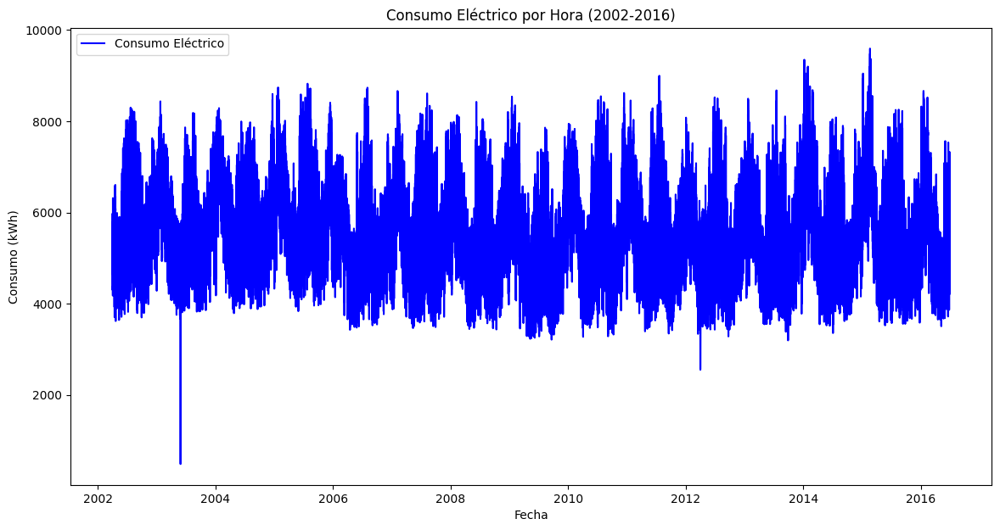

In [ ]:
# Graficar la serie temporal
plt.figure(figsize=(14, 7))
plt.plot(df_energy_copy['Energy'], color='blue', label='Consumo Eléctrico')
plt.title('Consumo Eléctrico por Hora (2002-2016)')
plt.xlabel('Fecha')
plt.ylabel('Consumo (kWh)')
plt.legend()
plt.show()

In [ ]:
import pandas as pd
import plotly.express as px
# Agrupar los datos por día usando la media MENSUAL
df_diario = df_energy_copy['Energy'].resample('D').mean()

# Crear un DataFrame para Plotly
df_plot = df_diario.reset_index()
df_plot.columns = ['Fecha', 'Consumo Diario']

# Graficar la serie temporal mensual de manera interactiva
fig = px.line(df_plot, x='Fecha', y='Consumo Diario',
              title='Consumo Eléctrico Promedio Diario (2002-2016)',
              labels={'Fecha': 'Fecha', 'Consumo Diario': 'Consumo Diario (kWh)'},
              markers=True)

# Personalizar el eje X para mostrar meses
fig.update_xaxes(
    dtick="M2",  # Marca cada mes
    tickformat="%d %b %Y",  # Formato de mes y año
)

# Mostrar la figura
fig.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Agrupar los datos por mes usando la media mensual
df_mensual = df_energy_copy['Energy'].resample('M').mean()

# Crear un DataFrame para Plotly
df_plot = df_mensual.reset_index()
df_plot.columns = ['Fecha', 'Consumo Mensual']
years = df_plot['Fecha'].dt.year

# Graficar la serie temporal mensual de manera interactiva
fig = px.line(df_plot, x='Fecha', y='Consumo Mensual',
              title='Consumo Eléctrico Promedio Mensual (2002-2016)',
              labels={'Fecha': 'Fecha', 'Consumo Mensual': 'Consumo Mensual (kWh)'},
              markers=True)

# Personalizar el eje X para mostrar meses
fig.update_xaxes(
    dtick="M2",  # Marca cada mes
    tickformat="%b %Y",  # Formato de mes y año
)

# Mostrar la figura
fig.show()


<ipython-input-31-13cc6fc0b4e4>:5: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



Si vemos indicios de estacionalidad visualmente.
- Los meses de enero generalmente hay un pico en el consumo.
- Los meses de mayo generalmente hay una bajada en el consumo.


## 3.2 Dickey-Fuller Aumentada (ADF)

Esta es una de las pruebas más comunes para verificar la estacionariedad. Su objetivo principal es determinar si una serie temporal contiene una raíz unitaria, lo que implica que es no estacionaria.

La presencia de una raíz unitaria en la serie implica que la serie es no estacionaria.

- Una raíz unitaria es un concepto que se refiere a que los efectos de shocks (perturbaciones o eventos inesperados) en la serie temporal persisten a largo plazo.

Las series no estacionarias pueden mostrar tendencias o patrones estacionales.

https://numxl.com/es/blogs/prueba-dickey-fuller-aumentada/

In [ ]:
import pandas as pd
from statsmodels.tsa.stattools import adfuller

# Realizar la prueba ADF
result = adfuller(df_energy_copy['Energy'])

# Imprimir resultados
print('ADF Statistic:', result[0])
print('p-value:', result[1])
for key, value in result[4].items():
    print(f'Critical Values {key}: {value}')

# Interpretación
if result[1] < 0.05:
    print("La serie es estacionaria (rechazamos H0)")
else:
    print("La serie no es estacionaria (no podemos rechazar H0)")


ADF Statistic: -20.357096611511913
p-value: 0.0
Critical Values 1%: -3.430402389659626
Critical Values 5%: -2.861563155459512
Critical Values 10%: -2.566782324831993
La serie es estacionaria (rechazamos H0)


# 4 Función transformadora

Creamos una función que reune todas las tranformaciones conluidas en el EDA.

In [10]:
df_energy = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Machine Learning 2/data/energy_train.csv')

## 4.1 Función para obtener variables exógenas (estación, mes, semana, día, hora)

In [11]:
import numpy as np

def obtener_estacion(fecha):
      if fecha.month in [12, 1, 2]:
          return 'Invierno'
      elif fecha.month in [3, 4, 5]:
          return 'Primavera'
      elif fecha.month in [6, 7, 8]:
          return 'Verano'
      else:
        return 'Otoño'

In [12]:
def add_trig_transformations(df):
    """
    Añade las transformaciones trigonométricas para las variables de hora,
    día de la semana y mes del DataFrame.
    """

    # Asegurarse de que el índice es de tipo datetime
    if not pd.api.types.is_datetime64_any_dtype(df.index):
        raise ValueError("El índice del DataFrame debe ser de tipo datetime.")

    # Variables exógenas
    df['Mes'] = df.index.month  # Agregar el mes del año (1 a 12)
    df['Dia_de_la_semana'] = df.index.dayofweek  # Agregar el día de la semana (0 = Lunes, 6 = Domingo)
    df['hour'] = df.index.hour  # Agregar la hora (0 a 23)

    # Transformación trigonométrica para la hora (0-23)
    df['hora_seno'] = np.sin(2 * np.pi * df['hour'] / 24)
    df['hora_coseno'] = np.cos(2 * np.pi * df['hour'] / 24)

    # Transformación trigonométrica para el día de la semana (0 = Lunes, 6 = Domingo)
    df['dia_seno'] = np.sin(2 * np.pi * df['Dia_de_la_semana'] / 7)
    df['dia_coseno'] = np.cos(2 * np.pi * df['Dia_de_la_semana'] / 7)

    # Transformación trigonométrica para el mes (1-12)
    df['mes_seno'] = np.sin(2 * np.pi * df['Mes'] / 12)
    df['mes_coseno'] = np.cos(2 * np.pi * df['Mes'] / 12)

    # Eliminamos las otras columnas que no van a ser variables a tener en cuenta
    df.drop('hour', axis=1, inplace=True)
    df.drop('Dia_de_la_semana', axis=1, inplace=True)
    df.drop('Mes', axis=1, inplace=True)

    return df

## 4.2 Función para el tratamiento de Outliers

In [13]:
# No lo utilizamos
def imputacion_outliers_SARIMA(df):

  # Ouliers con z-score y substitución con SARIMA
  mean_consumo = df['Energy'].mean()
  std_consumo = df['Energy'].std()
  df['z_score'] = (df['Energy'] - mean_consumo) / std_consumo
  model = SARIMAX(df['Energy'], order=(1,1,1), seasonal_order=(1,1,1,12))
  model_fit = model.fit()

  # Predecir valores
  predicted_values = model_fit.predict()

  # Reemplazar outliers con valores predichos
  df.loc[np.abs(df['z_score']) > 3, 'Energy'] = predicted_values
  df.drop('z_score', axis=1, inplace=True)

  return df

In [14]:
def winsorized(df, lower_percentile, upper_percentile):

  # Calcular la media y la desviación estándar del consumo eléctrico
  mean_consumo = df['Energy'].mean()
  std_consumo = df['Energy'].std()

  # Calcular el Z-Score
  df['z_score'] = (df_energy['Energy'] - mean_consumo) / std_consumo

  # Calcular los límites de winsorización
  lower_limit = np.percentile(df['Energy'], lower_percentile)
  upper_limit = np.percentile(df['Energy'], upper_percentile)

  # Reemplazar valores extremos
  df.loc[df['z_score'] > 3, 'Energy'] = upper_limit
  df.loc[df['z_score'] < -3, 'Energy'] = lower_limit
  df.drop('z_score', axis=1, inplace=True)

  return df

## 4.3 Función final

In [15]:
def transform_data(df):

  # Conversión del formato fecha y se establece como índice
  df['Datetime'] = pd.to_datetime(df['Datetime'], format='%Y-%m-%d %H:%M:%S')
  df = df.set_index('Datetime')

  # duplicados
  df = df.groupby(df.index).mean()

  # Asignamos frecuéncia
  df = df.asfreq('1h')
  df = df.sort_index()

  # Imputación de valores mediante interpolación lineal (calcula una línea recta entre los puntos existentes y estima los valores intermedios.)
  df['Energy'] = df['Energy'].interpolate(method='linear')

  # variables exógenas
  df = add_trig_transformations(df)

  # Aplicar la función al índice de fechas para obtener la estación del año
  df['Estacion'] = df.index.map(obtener_estacion)
  df = pd.get_dummies(df, columns=['Estacion'], drop_first=True)
  df[['Estacion_Otoño', 'Estacion_Primavera', 'Estacion_Verano']] = df[['Estacion_Otoño', 'Estacion_Primavera', 'Estacion_Verano']].astype(int)

  return df

In [16]:
df_energy_copy = df_energy.copy()
df_transformed = winsorized(df_energy_copy, 5, 95)
df_transformed = transform_data(df_transformed)

In [17]:
df_transformed.describe()

,Energy,hora_seno,hora_coseno,dia_seno,dia_coseno,mes_seno,mes_coseno,Estacion_Otoño,Estacion_Primavera,Estacion_Verano
count,124896.000000,1.248960e+05,1.248960e+05,124896.000000,124896.000000,1.248960e+05,1.248960e+05,124896.000000,124896.000000,124896.000000
mean,5595.615836,-1.851794e-17,-5.666319e-17,0.000341,0.000254,3.345764e-03,-1.556341e-02,0.244812,0.259216,0.253083
std,968.452697,7.071096e-01,7.071096e-01,0.707119,0.707100,7.037946e-01,7.102307e-01,0.429977,0.438206,0.434780
min,2690.000000,-1.000000e+00,-1.000000e+00,-0.974928,-0.900969,-1.000000e+00,-1.000000e+00,0.000000,0.000000,0.000000
25%,4905.000000,-7.071068e-01,-7.071068e-01,-0.781831,-0.900969,-5.000000e-01,-8.660254e-01,0.000000,0.000000,0.000000
50%,5534.000000,6.123234e-17,-6.123234e-17,0.000000,-0.222521,1.224647e-16,-1.836970e-16,0.000000,0.000000,0.000000
75%,6250.000000,7.071068e-01,7.071068e-01,0.781831,0.623490,5.000000e-01,5.000000e-01,0.000000,1.000000,1.000000
max,8524.000000,1.000000e+00,1.000000e+00,0.974928,1.000000,1.000000e+00,1.000000e+00,1.000000,1.000000,1.000000


In [54]:
df_transformed

,Energy,hora_seno,hora_coseno,dia_seno,dia_coseno,mes_seno,mes_coseno,Estacion_Otoño,Estacion_Primavera,Estacion_Verano
Datetime,,,,,,,,,,
2002-04-01 01:00:00,4374.0,0.258819,0.965926,0.000000,1.000000,8.660254e-01,-0.5,0,1,0
2002-04-01 02:00:00,4306.0,0.500000,0.866025,0.000000,1.000000,8.660254e-01,-0.5,0,1,0
2002-04-01 03:00:00,4322.0,0.707107,0.707107,0.000000,1.000000,8.660254e-01,-0.5,0,1,0
2002-04-01 04:00:00,4359.0,0.866025,0.500000,0.000000,1.000000,8.660254e-01,-0.5,0,1,0
2002-04-01 05:00:00,4436.0,0.965926,0.258819,0.000000,1.000000,8.660254e-01,-0.5,0,1,0
...,...,...,...,...,...,...,...,...,...,...
2016-06-29 20:00:00,5828.0,-0.866025,0.500000,0.974928,-0.222521,1.224647e-16,-1.0,0,0,1
2016-06-29 21:00:00,5659.0,-0.707107,0.707107,0.974928,-0.222521,1.224647e-16,-1.0,0,0,1
2016-06-29 22:00:00,5606.0,-0.500000,0.866025,0.974928,-0.222521,1.224647e-16,-1.0,0,0,1


# 5 Separación datos train-val-test

División del 80% para entrenamiento y validación, y un 20% para prueba.

In [18]:
import pandas as pd
from sklearn.model_selection import train_test_split


# Copia para no sobreescribir
df_transformed_copy = df_transformed.copy()

# Supongamos que df es tu DataFrame y 'Energy' es la columna que deseas predecir
X = df_transformed_copy
y = df_transformed_copy['Energy']

# Dividir los datos en train + validation (80%) y test (20%)
train_size = 0.8  # Usamos el 80% de los datos para entrenamiento + validación
split_index = int(train_size * len(X))

# División de datos en entrenamiento + validación y prueba
X_train_val, X_test = X[:split_index], X[split_index:]
y_train_val, y_test = y[:split_index], y[split_index:]

# Dividir train_val en train y validation
val_size = 0.25  # El 25% del train + val (80%) se reserva para validación
split_index_val = int((1 - val_size) * len(X_train_val))

X_train, X_val = X_train_val[:split_index_val], X_train_val[split_index_val:]
y_train, y_val = y_train_val[:split_index_val], y_train_val[split_index_val:]


# Comprobación de las longitudes de los conjuntos
print(f'Tamaño de X_train: {len(X_train)}')
print(f'Tamaño de X_val: {len(X_val)}')
print(f'Tamaño de X_test: {len(X_test)}')


Tamaño de X_train: 74937
Tamaño de X_val: 24979
Tamaño de X_test: 24980


# 6 Exploración de diferentes modelos de ML

***Como métrica de evaluación vamos a utilizar***: El RMSE (Root Mean Squared Error o Raíz del Error Cuadrático Medio) es una métrica de evaluación que mide la precisión de un modelo de predicción, calculando la desviación promedio entre los valores reales y los valores predichos. Es la raíz cuadrada del MSE (Mean Squared Error o Error Cuadrático Medio), lo cual permite expresar el error en las mismas unidades que los datos originales, lo que facilita su interpretación.


## 6.1 Regresión Lineal

Regresión lineal con regularización Ridge.

Conceptos importantes de conocer:

- Lags o rezagazos: Los lags son valores pasados de la misma serie de tiempo que se usan como variables predictoras para estimar valores futuros.
- Steps: se refieren a la cantidad de períodos en el futuro que quieres pronosticar.

https://skforecast.org/0.13.0/api/forecasterautoreg

In [97]:
# Modelo forecasting con skforecast baseline
from skforecast.ForecasterAutoreg import ForecasterAutoreg
from skforecast.model_selection import grid_search_forecaster
from skforecast.model_selection import backtesting_forecaster

# Crear forecaster
forecaster_lr = ForecasterAutoreg(
                 regressor     = Ridge(random_state=123),
                 lags          = 168, # horas en un mes
                 transformer_y = StandardScaler(),
                 forecaster_id = 'consumo_electrico'
             )
forecaster_lr

ForecasterAutoreg 
Regressor: Ridge(random_state=123) 
Lags: [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126
 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144
 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162
 163 164 165 166 167 168] 
Transformer for y: StandardScaler() 
Transformer for exog: None 
Window size: 168 
Weight function included: False 
Differentiation order: None 
Exogenous included: False 
Exogenous variables names: None 
Training range: None 
Training index type: None 
T

In [98]:
exog_features = [col for col in df_transformed.columns if col.startswith(('hora_seno', 'hora_coseno', 'dia_seno', 'dia_coseno', 'mes_seno', 'mes_coseno', 'Estacion_Otoño', 'Estacion_Primavera', 'Estacion_Verano'))]

fin_validacion = '2012-03-21'
fin_train_val = X_train_val.index.max()
inicio_test = X_test.index.min()

# Realizar backtesting con la métrica actual
resultado, predicciones = backtesting_forecaster(

        forecaster         = forecaster_lr,
        y                  = df_transformed['Energy'],
        initial_train_size = len(df_transformed.loc[:fin_train_val, :]),  # Tamaño de entrenamiento inicial
        exog               = df_transformed[exog_features],
        steps              = 21912,  # Número de pasos de pronóstico (horas en 1 año y 6 meses)
        refit              = True,
        fixed_train_size   = False,
        metric             = 'mean_squared_error',
        verbose            = True,
        show_progress      = True
    )


Information of backtesting process
----------------------------------
Number of observations used for initial training: 99916
Number of observations used for backtesting: 24980
    Number of folds: 2
    Number skipped folds: 0 
    Number of steps per fold: 21912
    Number of steps to exclude from the end of each train set before test (gap): 0
    Last fold only includes 3068 observations.

Fold: 0
    Training:   2002-04-01 01:00:00 -- 2013-08-24 04:00:00  (n=99916)
    Validation: 2013-08-24 05:00:00 -- 2016-02-23 04:00:00  (n=21912)
Fold: 1
    Training:   2002-04-01 01:00:00 -- 2016-02-23 04:00:00  (n=121828)
    Validation: 2016-02-23 05:00:00 -- 2016-06-30 00:00:00  (n=3068)



  0%|          | 0/2 [00:00<?, ?it/s]

In [99]:
resultado

,mean_squared_error
0,480276.515982


In [56]:
X_train_val .index.max()

Timestamp('2013-08-24 04:00:00')

In [100]:
RMSE = resultado ** 0.5
print(f"El Root Mean Squared Error (RMSE) es: {RMSE}")

El Root Mean Squared Error (RMSE) es:    mean_squared_error
0          693.019853


De meida el modelo de regresión lineal comete un error de alrededor de 749 en sus predicciones.

In [101]:
import plotly.graph_objects as go
import pandas as pd

y_test_ = y_test.squeeze()  # Convierte a Serie si es DataFrame de una sola columna
predicciones_ = predicciones.squeeze()  # Igual para las predicciones

results_df = pd.DataFrame({
    'Fecha': y_test.index,  # Suponiendo que ambos tienen el mismo índice de fechas
    'y_test': y_test_.values,
    'Predicciones': predicciones_.values  # Suponiendo que 'predicciones' es tu Serie de predicciones
})

# Crear una figura de Plotly
fig = go.Figure()

# Agregar la serie de y_test (valores reales)
fig.add_trace(go.Scatter(
    x=results_df['Fecha'],
    y=results_df['y_test'],
    mode='lines',
    name='Valores Reales',
    line=dict(color='blue')
))

# Agregar la serie de Predicciones
fig.add_trace(go.Scatter(
    x=results_df['Fecha'],
    y=results_df['Predicciones'],
    mode='lines',
    name='Predicciones',
    line=dict(color='red')
))

# Personalizar el gráfico
fig.update_layout(
    title='Comparación de Predicciones y Valores Reales',
    xaxis_title='Fecha',
    yaxis_title='Valor',
    #template='plotly_dark',  # Puedes cambiar el tema si lo deseas
    legend=dict(x=0, y=1)
)

# Mostrar el gráfico
fig.show()


## 6.2 SARIMA (pendiente)

El SARIMA es un algoritmo muy lento, voy a agrupar los datos en días para poder hacer las predicciones. El modelo SARIMA se entrenará con los datos agrupados en días y las predicciones saldrán en días.

In [ ]:
!pip install pmdarima

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 19.3 MB/s eta 0:00:00


In [ ]:
from skforecast.Sarimax import Sarimax
from skforecast.ForecasterSarimax import ForecasterSarimax
from skforecast.model_selection_sarimax import backtesting_sarimax
from skforecast.model_selection_sarimax import grid_search_sarimax

In [ ]:
# Modelo SARIMA con ForecasterSarimax y skforecast Sarimax
forecaster_SARIMA = ForecasterSarimax(
                 regressor=Sarimax(order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
             )

In [ ]:
# Backtesting con SARIMA:
from skforecast.ForecasterSarimax import ForecasterSarimax
from skforecast.model_selection_sarimax import backtesting_sarimax

exog_features = [col for col in df_transformed.columns if col.startswith(('hora_seno', 'hora_coseno', 'dia_seno', 'dia_coseno',
       'mes_seno', 'mes_coseno', 'Estacion_Otoño', 'Estacion_Primavera', 'Estacion_Verano'))]

fin_validacion = '2012-03-21'
fin_train_val = X_train_val_daily.index.max()
inicio_test = X_test_daily.index.min()

metrica_SARIMA, predicciones_SARIMA = backtesting_sarimax(
                            forecaster         = forecaster_SARIMA,
                            y                  = df_transformed_daily.Energy,
                            initial_train_size = len(df_transformed_daily.loc[:fin_train_val, :]), # Train
                            exog               = df_transformed_daily[exog_features],
                            steps              = 30, # Horas en un año y 6 meses
                            refit              = True,
                            fixed_train_size   = False,
                            metric             = 'mean_absolute_error',
                            verbose            = True,
                            show_progress      = True
                        )
metrica_SARIMA

KeyboardInterrupt: 

In [ ]:
import plotly.graph_objects as go
import pandas as pd

# Supongamos que tus predicciones y y_test son Series de Pandas o DataFrames
# Convertirlos a un DataFrame conjunto para la comparación

y_test_ = y_test_daily.squeeze()  # Convierte a Serie si es DataFrame de una sola columna
predicciones_ = predicciones_SARIMA.squeeze()  # Igual para las predicciones

results_df = pd.DataFrame({
    'Fecha': y_test_daily.index,  # Suponiendo que ambos tienen el mismo índice de fechas
    'y_test': y_test_.values,
    'Predicciones': predicciones_.values  # Suponiendo que 'predicciones' es tu Serie de predicciones
})

# Crear una figura de Plotly
fig = go.Figure()

# Agregar la serie de y_test (valores reales)
fig.add_trace(go.Scatter(
    x=results_df['Fecha'],
    y=results_df['y_test'],
    mode='lines',
    name='Valores Reales',
    line=dict(color='blue')
))

# Agregar la serie de Predicciones
fig.add_trace(go.Scatter(
    x=results_df['Fecha'],
    y=results_df['Predicciones'],
    mode='lines',
    name='Predicciones',
    line=dict(color='red')
))

# Personalizar el gráfico
fig.update_layout(
    title='Comparación de Predicciones y Valores Reales',
    xaxis_title='Fecha',
    yaxis_title='Valor',
    #template='plotly_dark',  # Puedes cambiar el tema si lo deseas
    legend=dict(x=0, y=1)
)

# Mostrar el gráfico
fig.show()

In [ ]:
# Entrenamos (tarda mucho)
exog_features = [col for col in df_transformed.columns if col.startswith(('hora_seno', 'hora_coseno', 'dia_seno', 'dia_coseno',
       'mes_seno', 'mes_coseno', 'Estacion_Otoño', 'Estacion_Primavera', 'Estacion_Verano'))]

forecaster_SARIMA.fit(y = X_train_val.Energy, exog = X_train_val[exog_features], suppress_warnings=True)


KeyboardInterrupt: 

In [ ]:
# Predicción
predicciones = forecaster_SARIMA.predict(steps=len(X_test))
predicciones.head(4)

## 6.3 Modelos ***Gradient Boosting***

- El Gradient Boosting es un método de ensamble que construye un modelo fuerte a partir de una serie de modelos débiles (por lo general, árboles de decisión). Cada árbol se entrena para corregir los errores residuales del árbol anterior, de manera que el modelo en conjunto mejore iterativamente.

- HistGradientBoostingRegressor es una implementación de Gradient Boosting en scikit-learn que utiliza un enfoque basado en histogramas para entrenar árboles de decisión de manera más eficiente, especialmente en conjuntos de datos grandes. Este modelo, inspirado en LightGBM y XGBoost, fue introducido en scikit-learn para ofrecer un método rápido y escalable para problemas de regresión.

- CatBoostRegressor

- LightGBM: Light Gradient Boosting Machine, basada en el algoritmo de gradient boosting, donde se combinan varios árboles de decisión débiles (o modelos base) para crear un modelo predictivo más fuerte.


Descargamos e importamos las librerías necesarias:

In [5]:
!pip install xgboost
!pip install lightgbm
!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 7.6 MB/s eta 0:00:00


In [6]:
from skforecast.ForecasterAutoreg import ForecasterAutoreg
from skforecast.model_selection import grid_search_forecaster
from skforecast.model_selection import backtesting_forecaster
import xgboost
import lightgbm
import catboost
import sklearn
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.ensemble import HistGradientBoostingRegressor

In [103]:
import pandas as pd

# Crear forecaster
regressors = {
    'CatBoostRegressor' : CatBoostRegressor(random_state=123),
    'XGBRegressor': XGBRegressor(tree_method="hist", enable_categorical=True, random_state=123),
    'HistGradientBoostingRegressor' : HistGradientBoostingRegressor(random_state=123),
    'LGBMRegressor' : LGBMRegressor(random_state=123),
}

resultados_metricas_gb = {}
predicciones_gradient_boosting = {}

for nombre, regressor in regressors.items():
    print(f'\nEvaluando con el regressor: {nombre}')
    print(120 * "-")

    forecaster_gb = ForecasterAutoreg(
        regressor=regressor,
        lags = 168,
        transformer_y=StandardScaler(),
        forecaster_id='consumo_electrico'
    )

    # Definir las características exógenas
    exog_features = [col for col in df_transformed.columns if col.startswith(('hora_seno', 'hora_coseno', 'dia_seno', 'dia_coseno', 'mes_seno', 'mes_coseno', 'Estacion_Otoño', 'Estacion_Primavera', 'Estacion_Verano'))]

    fin_validacion = '2012-03-21'
    fin_train_val = X_train_val.index.max()
    inicio_test = X_test.index.min()

    # Realizar backtesting con la métrica actual
    metrica_gb, predicciones_gb = backtesting_forecaster(

        forecaster=forecaster_gb,
        y=df_transformed.Energy,
        initial_train_size=len(df_transformed.loc[:fin_train_val, :]),  # Train
        exog=df_transformed[exog_features],
        steps=21912,  # Horas en un año y 6 meses
        refit=True,
        fixed_train_size=False,
        metric='mean_squared_error',
        verbose=True,
        show_progress=True
    )

    # Guardar resultados en los diccionarios con el nombre del regressor
    resultados_metricas_gb[nombre] = metrica_gb

    # Convertir las predicciones en un DataFrame con fechas como índice
    predicciones_df = pd.DataFrame(predicciones_gb, columns=['pred'], index=X_test.index)

    # Guardar las predicciones en el diccionario
    predicciones_gradient_boosting[nombre] = predicciones_df

# Mostrar las predicciones para un modelo (ejemplo para 'CatBoostRegressor')
print(predicciones_gradient_boosting['CatBoostRegressor'])


Evaluando con el regressor: CatBoostRegressor
------------------------------------------------------------------------------------------------------------------------
Learning rate set to 0.084724
0:	learn: 0.9243913	total: 231ms	remaining: 3m 51s
1:	learn: 0.8560955	total: 409ms	remaining: 3m 23s
2:	learn: 0.7907525	total: 651ms	remaining: 3m 36s
3:	learn: 0.7327177	total: 860ms	remaining: 3m 34s
4:	learn: 0.6802798	total: 1.27s	remaining: 4m 12s
5:	learn: 0.6305006	total: 1.66s	remaining: 4m 34s
6:	learn: 0.5852837	total: 1.9s	remaining: 4m 29s
7:	learn: 0.5430046	total: 2.2s	remaining: 4m 32s
8:	learn: 0.5048954	total: 2.42s	remaining: 4m 26s
9:	learn: 0.4698393	total: 2.58s	remaining: 4m 15s
10:	learn: 0.4381490	total: 2.79s	remaining: 4m 11s
11:	learn: 0.4086401	total: 2.99s	remaining: 4m 6s
12:	learn: 0.3818765	total: 3.2s	remaining: 4m 3s
13:	learn: 0.3579912	total: 3.39s	remaining: 3m 58s
14:	learn: 0.3358058	total: 3.56s	remaining: 3m 54s
15:	learn: 0.3155497	total: 3.67s	rem

  0%|          | 0/2 [00:00<?, ?it/s]

Learning rate set to 0.087424
0:	learn: 0.9221060	total: 143ms	remaining: 2m 23s
1:	learn: 0.8511435	total: 286ms	remaining: 2m 22s
2:	learn: 0.7855023	total: 400ms	remaining: 2m 13s
3:	learn: 0.7243622	total: 544ms	remaining: 2m 15s
4:	learn: 0.6693237	total: 731ms	remaining: 2m 25s
5:	learn: 0.6191227	total: 972ms	remaining: 2m 41s
6:	learn: 0.5726479	total: 1.2s	remaining: 2m 50s
7:	learn: 0.5307042	total: 1.44s	remaining: 2m 58s
8:	learn: 0.4920111	total: 1.66s	remaining: 3m 3s
9:	learn: 0.4567395	total: 1.91s	remaining: 3m 8s
10:	learn: 0.4247887	total: 2.13s	remaining: 3m 11s
11:	learn: 0.3954107	total: 2.32s	remaining: 3m 11s
12:	learn: 0.3688735	total: 2.53s	remaining: 3m 12s
13:	learn: 0.3450220	total: 2.76s	remaining: 3m 14s
14:	learn: 0.3228362	total: 2.98s	remaining: 3m 15s
15:	learn: 0.3030192	total: 3.19s	remaining: 3m 16s
16:	learn: 0.2859193	total: 3.48s	remaining: 3m 21s
17:	learn: 0.2697815	total: 3.71s	remaining: 3m 22s
18:	learn: 0.2554637	total: 3.92s	remaining: 3m

  0%|          | 0/2 [00:00<?, ?it/s]


Evaluando con el regressor: HistGradientBoostingRegressor
------------------------------------------------------------------------------------------------------------------------
Information of backtesting process
----------------------------------
Number of observations used for initial training: 99916
Number of observations used for backtesting: 24980
    Number of folds: 2
    Number skipped folds: 0 
    Number of steps per fold: 21912
    Number of steps to exclude from the end of each train set before test (gap): 0
    Last fold only includes 3068 observations.

Fold: 0
    Training:   2002-04-01 01:00:00 -- 2013-08-24 04:00:00  (n=99916)
    Validation: 2013-08-24 05:00:00 -- 2016-02-23 04:00:00  (n=21912)
Fold: 1
    Training:   2002-04-01 01:00:00 -- 2016-02-23 04:00:00  (n=121828)
    Validation: 2016-02-23 05:00:00 -- 2016-06-30 00:00:00  (n=3068)



  0%|          | 0/2 [00:00<?, ?it/s]


Evaluando con el regressor: LGBMRegressor
------------------------------------------------------------------------------------------------------------------------
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.247733 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 42922
[LightGBM] [Info] Number of data points in the train set: 99748, number of used features: 177
[LightGBM] [Info] Start training from score 0.000383
Information of backtesting process
----------------------------------
Number of observations used for initial training: 99916
Number of observations used for backtesting: 24980
    Number of folds: 2
    Number skipped folds: 0 
    Number of steps per fold: 21912
    Number of steps to exclude from the end of each train set before test (gap): 0
    Last fold only includes 3068 observations.

Fold: 0
    Training:   2002-04-01 01:00:00 -- 2013-08-24 04:00:00  (n=99916)
    Validation: 20

  0%|          | 0/2 [00:00<?, ?it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.495905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 42922
[LightGBM] [Info] Number of data points in the train set: 121660, number of used features: 177
[LightGBM] [Info] Start training from score 0.000322
                            pred
Datetime                        
2013-08-24 05:00:00  3949.138797
2013-08-24 06:00:00  3992.633612
2013-08-24 07:00:00  4075.184202
2013-08-24 08:00:00  4277.294988
2013-08-24 09:00:00  4561.871090
...                          ...
2016-06-29 20:00:00  7100.049516
2016-06-29 21:00:00  6978.508424
2016-06-29 22:00:00  6851.633740
2016-06-29 23:00:00  6340.123990
2016-06-30 00:00:00  5770.706657

[24980 rows x 1 columns]


In [104]:
# MSE
resultados_metricas_gb

{'CatBoostRegressor':    mean_squared_error
 0       373013.385874,
 'XGBRegressor':    mean_squared_error
 0       512700.613764,
 'HistGradientBoostingRegressor':    mean_squared_error
 0       960367.174429,
 'LGBMRegressor':    mean_squared_error
 0       618575.497205}

In [105]:
# RSME
for model, mse in resultados_metricas_gb.items():
  print(f"El RSME del modelo de {model} dispone de un RSME  = {mse ** 0.5}")
  print(120 * "-")

El RSME del modelo de CatBoostRegressor dispone de un RSME  =    mean_squared_error
0          610.748218
------------------------------------------------------------------------------------------------------------------------
El RSME del modelo de XGBRegressor dispone de un RSME  =    mean_squared_error
0          716.031154
------------------------------------------------------------------------------------------------------------------------
El RSME del modelo de HistGradientBoostingRegressor dispone de un RSME  =    mean_squared_error
0          979.983252
------------------------------------------------------------------------------------------------------------------------
El RSME del modelo de LGBMRegressor dispone de un RSME  =    mean_squared_error
0          786.495707
------------------------------------------------------------------------------------------------------------------------


Graficamos

In [106]:
lista_modelos = list(predicciones_gradient_boosting.keys())
lista_modelos

['CatBoostRegressor',
 'XGBRegressor',
 'HistGradientBoostingRegressor',
 'LGBMRegressor']

In [107]:
import plotly.graph_objects as go
import pandas as pd


lista_modelos = list(predicciones_gradient_boosting.keys())

for modelo in lista_modelos:

  y_test_ = y_test.squeeze()  # Convierte a Serie si es DataFrame de una sola columna
  predicciones_ = predicciones_gradient_boosting[modelo].squeeze()  # Igual para las predicciones

  results_df = pd.DataFrame({
      'Fecha': y_test.index,  # Suponiendo que ambos tienen el mismo índice de fechas
      'y_test': y_test_.values,
      'Predicciones': predicciones_.values  # Suponiendo que 'predicciones' es tu Serie de predicciones
  })

  # Crear una figura de Plotly
  fig = go.Figure()

  # Agregar la serie de y_test (valores reales)
  fig.add_trace(go.Scatter(
      x=results_df['Fecha'],
      y=results_df['y_test'],
      mode='lines',
      name='Valores Reales',
      line=dict(color='blue')
  ))

  # Agregar la serie de Predicciones
  fig.add_trace(go.Scatter(
      x=results_df['Fecha'],
      y=results_df['Predicciones'],
      mode='lines',
      name='Predicciones',
      line=dict(color='red')
  ))

  # Personalizar el gráfico
  fig.update_layout(
      title=f'Comparación de Predicciones y Valores Reales con {modelo}',
      xaxis_title='Fecha',
      yaxis_title='Valor',
      #template='plotly_dark',  # Puedes cambiar el tema si lo deseas
      legend=dict(x=0, y=1)
  )

  # Mostrar el gráfico
  fig.show()

## 6.5 LSTM (Pendiente)

In [ ]:
import skforecast
from skforecast.ForecasterRnn import ForecasterRnn
from skforecast.ForecasterRnn.utils import create_and_compile_model
from sklearn.preprocessing import MinMaxScaler
from skforecast.model_selection_multiseries import backtesting_forecaster_multiseries

In [ ]:
# Creación del forecaster

forecaster = ForecasterRnn(
    regressor=model,
    levels=levels,
    transformer_series=MinMaxScaler(),
    fit_kwargs={
        "epochs": 10,  # Número de épocas para entrenar el modelo.
        "batch_size": 32,  # Tamaño del batch para entrenar el modelo.
        "callbacks": [
            EarlyStopping(monitor="val_loss", patience=5)
        ],  # Callback para detener el entrenamiento cuando ya no esté aprendiendo más.
        "series_val": data_val,  # Datos de validación para el entrenamiento del modelo.
    },
)
forecaster

# 7 Selección del Modelo Final

## 7.1 Mejor modelo según RMSE (Root Mean Square Error) sin Tuning de hiper parametros


Las métricas son las siguientes:

- RMSE CatBoostRegressor = 626.96
- RMSE XGBoost = 701.77
- RMSE HistGradientBoosting = 711.42
- RMSE Regresión Lineal = 749.13
- RMSE LGBMRegressor = 889.32
          
***En conlusión el mejor algoritmo encontrado con el menor RMSE es el CatBoostRegressor.***



## 7.2 Tuning de Hiper Parametros de CatBoost

In [27]:
forecaster_catboost = ForecasterAutoreg(
    regressor = CatBoostRegressor(
                    random_state=123),
    lags = 720,
    transformer_y = StandardScaler()
)


In [116]:
# Búsqueda de hiperparámetros | Búsqueda 1

exog_cols = [
     col for col in df_transformed.columns if col.startswith
      (('hora_seno', 'hora_coseno', 'dia_seno', 'dia_coseno', 'mes_seno', 'mes_coseno', 'Estacion_Otoño', 'Estacion_Primavera', 'Estacion_Verano'))]

#lags_grid = [48, 72, 168, 720]
fin_validacion = X_val.index.max()


def search_space(trial):
    search_space  = {
        'n_estimators'  : trial.suggest_int('n_estimators', 100, 1000, step=100),
        'max_depth'     : trial.suggest_int('max_depth', 3, 10, step=1),
        'learning_rate' : trial.suggest_float('learning_rate', 0.01, 1)
        #'lags'          : trial.suggest_categorical('lags', lags_grid)
    }
    return search_space

results_search, frozen_trial = bayesian_search_forecaster(
    forecaster         = forecaster_catboost,
    y                  = df_transformed.loc[:fin_validacion, 'Energy'],
    exog               = df_transformed.loc[:fin_validacion, exog_cols],
    search_space       = search_space,
    steps              = 21912,
    refit              = False,
    metric             = 'mean_squared_error',
    initial_train_size = len(X_train),
    fixed_train_size   = False,
    n_trials           = 20,
    random_state       = 123,
    return_best        = True,
    n_jobs             = 'auto',
    verbose            = False,
    show_progress      = True
)

  0%|          | 0/20 [00:00<?, ?it/s]

`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126
 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144
 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162
 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180
 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198
 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216
 217 218 219 220 221 222 22

In [7]:
from skforecast.ForecasterAutoreg import ForecasterAutoreg
from catboost import CatBoostRegressor
from sklearn.preprocessing import StandardScaler

forecaster_tuning_catboost = ForecasterAutoreg(
    regressor = CatBoostRegressor(
                    n_estimators=600,                # Número de estimadores
                    max_depth=8,                     # Profundidad máxima
                    learning_rate=0.42887539552321635, # Tasa de aprendizaje
                    random_state=123,
                    silent=True,
                    allow_writing_files=False,
                    boosting_type='Plain',           # Entrenamiento más rápido
                    leaf_estimation_iterations=3     # Entrenamiento más rápido
                ),
    lags = 720,
    transformer_y = StandardScaler()
)


In [20]:
X_val.index.max()

Timestamp('2013-08-24 04:00:00')

In [21]:
X_test.index.max()

Timestamp('2016-06-30 00:00:00')

In [22]:
# Realizar backtesting con la métrica actual
exog_features = [col for col in df_transformed.columns if col.startswith(('hora_seno', 'hora_coseno', 'dia_seno', 'dia_coseno', 'mes_seno', 'mes_coseno', 'Estacion_Otoño', 'Estacion_Primavera', 'Estacion_Verano'))]
fin_train_val = X_val.index.max()

metrica_catboost, predicciones_catboost = backtesting_forecaster(

        forecaster=forecaster_tuning_catboost,
        y=df_transformed.Energy,
        initial_train_size=len(df_transformed.loc[:fin_train_val, :]),  # Todo Train
        exog=df_transformed[exog_features],
        steps=21912,  # Horas en un año y 6 meses
        refit=True,
        fixed_train_size=False,
        metric='mean_squared_error',
        verbose=True,
        show_progress=True
    )

Information of backtesting process
----------------------------------
Number of observations used for initial training: 99916
Number of observations used for backtesting: 24980
    Number of folds: 2
    Number skipped folds: 0 
    Number of steps per fold: 21912
    Number of steps to exclude from the end of each train set before test (gap): 0
    Last fold only includes 3068 observations.

Fold: 0
    Training:   2002-04-01 01:00:00 -- 2013-08-24 04:00:00  (n=99916)
    Validation: 2013-08-24 05:00:00 -- 2016-02-23 04:00:00  (n=21912)
Fold: 1
    Training:   2002-04-01 01:00:00 -- 2016-02-23 04:00:00  (n=121828)
    Validation: 2016-02-23 05:00:00 -- 2016-06-30 00:00:00  (n=3068)



  0%|          | 0/2 [00:00<?, ?it/s]

In [24]:
RMSE_catboost = metrica_catboost ** 0.5
print(f"El Root Mean Squared Error (RMSE) es: {RMSE_catboost}")

El Root Mean Squared Error (RMSE) es:    mean_squared_error
0          632.032148


Vamos que hemos empeorado el modelo, pasamos de un RMSE de 626.96 a un 635.39. Nos quedamos con el modelo sin tuning.

## 7.3 Entrenamiento final y guardado del modelo entrenado

In [30]:
df_transformed.loc[:, exog_features]

,hora_seno,hora_coseno,dia_seno,dia_coseno,mes_seno,mes_coseno,Estacion_Otoño,Estacion_Primavera,Estacion_Verano
Datetime,,,,,,,,,
2002-04-01 01:00:00,0.258819,0.965926,0.000000,1.000000,8.660254e-01,-0.5,0,1,0
2002-04-01 02:00:00,0.500000,0.866025,0.000000,1.000000,8.660254e-01,-0.5,0,1,0
2002-04-01 03:00:00,0.707107,0.707107,0.000000,1.000000,8.660254e-01,-0.5,0,1,0
2002-04-01 04:00:00,0.866025,0.500000,0.000000,1.000000,8.660254e-01,-0.5,0,1,0
2002-04-01 05:00:00,0.965926,0.258819,0.000000,1.000000,8.660254e-01,-0.5,0,1,0
...,...,...,...,...,...,...,...,...,...
2016-06-29 20:00:00,-0.866025,0.500000,0.974928,-0.222521,1.224647e-16,-1.0,0,0,1
2016-06-29 21:00:00,-0.707107,0.707107,0.974928,-0.222521,1.224647e-16,-1.0,0,0,1
2016-06-29 22:00:00,-0.500000,0.866025,0.974928,-0.222521,1.224647e-16,-1.0,0,0,1


In [31]:
import joblib

# modelo
forecaster_catboost = ForecasterAutoreg(
    regressor = CatBoostRegressor(
                    random_state=123),
    lags = 720, # horas en un mes
    transformer_y = StandardScaler()
)

# variables exógenas
exog_features = [col for col in df_transformed.columns if col.startswith(('hora_seno', 'hora_coseno', 'dia_seno', 'dia_coseno', 'mes_seno', 'mes_coseno', 'Estacion_Otoño', 'Estacion_Primavera', 'Estacion_Verano'))]
exog_features_series = pd.Series(exog_features)

# Entrenamos el modelo con todos los datos (train + validación + test)
forecaster_catboost.fit(y=df_transformed.loc[:, 'Energy'], exog = df_transformed.loc[:, exog_features])




Learning rate set to 0.087708
0:	learn: 0.9226618	total: 610ms	remaining: 10m 9s
1:	learn: 0.8502438	total: 1.11s	remaining: 9m 13s
2:	learn: 0.7836285	total: 1.62s	remaining: 8m 59s
3:	learn: 0.7228459	total: 2.1s	remaining: 8m 43s
4:	learn: 0.6672219	total: 2.59s	remaining: 8m 34s
5:	learn: 0.6168922	total: 3.06s	remaining: 8m 27s
6:	learn: 0.5714968	total: 3.53s	remaining: 8m 21s
7:	learn: 0.5299067	total: 4.04s	remaining: 8m 21s
8:	learn: 0.4914060	total: 4.83s	remaining: 8m 51s
9:	learn: 0.4579180	total: 5.75s	remaining: 9m 28s
10:	learn: 0.4261809	total: 6.43s	remaining: 9m 38s
11:	learn: 0.3964613	total: 7.31s	remaining: 10m 2s
12:	learn: 0.3699011	total: 8.04s	remaining: 10m 10s
13:	learn: 0.3459949	total: 8.86s	remaining: 10m 24s
14:	learn: 0.3240292	total: 9.7s	remaining: 10m 37s
15:	learn: 0.3053952	total: 10.2s	remaining: 10m 29s
16:	learn: 0.2874680	total: 10.7s	remaining: 10m 16s
17:	learn: 0.2715319	total: 11.1s	remaining: 10m 5s
18:	learn: 0.2566928	total: 11.5s	remaini

In [33]:
# Guardar el modelo entrenado en un archivo
joblib.dump(forecaster_catboost, 'forecaster_catboost.pkl')
print("Modelo guardado exitosamente.")

Modelo guardado exitosamente.


In [ ]:
import plotly.graph_objects as go
import pandas as pd

# Supongamos que tus predicciones y y_test son Series de Pandas o DataFrames
# Convertirlos a un DataFrame conjunto para la comparación

y_test_ = y_test.squeeze()  # Convierte a Serie si es DataFrame de una sola columna
predicciones_ = predicciones.squeeze()  # Igual para las predicciones

results_df = pd.DataFrame({
    'Fecha': y_test.index,  # Suponiendo que ambos tienen el mismo índice de fechas
    'y_test': y_test_.values,
    'Predicciones': predicciones_.values  # Suponiendo que 'predicciones' es tu Serie de predicciones
})

# Crear una figura de Plotly
fig = go.Figure()

# Agregar la serie de y_test (valores reales)
fig.add_trace(go.Scatter(
    x=results_df['Fecha'],
    y=results_df['y_test'],
    mode='lines',
    name='Valores Reales',
    line=dict(color='blue')
))

# Agregar la serie de Predicciones
fig.add_trace(go.Scatter(
    x=results_df['Fecha'],
    y=results_df['Predicciones'],
    mode='lines',
    name='Predicciones',
    line=dict(color='red')
))

# Personalizar el gráfico
fig.update_layout(
    title='Comparación de Predicciones y Valores Reales',
    xaxis_title='Fecha',
    yaxis_title='Valor',
    #template='plotly_dark',  # Puedes cambiar el tema si lo deseas
    legend=dict(x=0, y=1)
)

# Mostrar el gráfico
fig.show()


## 7.4 Predicciones 01/07/2016 - 31/12/2018

In [34]:
# Importamos el modelo entrenado:
forecaster_tuning_catboost = joblib.load('forecaster_catboost.pkl')
print("Modelo cargado exitosamente.")


Modelo cargado exitosamente.


In [ ]:
  # variables exógenas
  df = add_trig_transformations(df)

  # Aplicar la función al índice de fechas para obtener la estación del año
  df['Estacion'] = df.index.map(obtener_estacion)

In [39]:
df_transformed.index.max()

Timestamp('2016-06-30 00:00:00')

In [51]:
# Crear rango de fechas con frecuencia horaria desde '2016-07-01 01:00:00' hasta '2018-12-01 01:00:00'
date_range = pd.date_range(start='2016-06-30 01:00:00', end='2018-12-31 00:00:00', freq='H')

# Crear DataFrame vacío con el rango de fechas como índice
df_exog = pd.DataFrame(index=date_range)
df_exog['Estacion'] = df_exog.index.map(obtener_estacion)
df_exog = add_trig_transformations(df_exog)
df_exog = pd.get_dummies(df_exog, columns=['Estacion'], drop_first=True)
df_exog[['Estacion_Otoño', 'Estacion_Primavera', 'Estacion_Verano']] = df_exog[['Estacion_Otoño', 'Estacion_Primavera', 'Estacion_Verano']].astype(int)

df_exog

<ipython-input-51-232affd0b425>:2: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start='2016-06-30 01:00:00', end='2018-12-31 00:00:00', freq='H')


,hora_seno,hora_coseno,dia_seno,dia_coseno,mes_seno,mes_coseno,Estacion_Otoño,Estacion_Primavera,Estacion_Verano
2016-06-30 01:00:00,0.258819,0.965926,0.433884,-0.900969,1.224647e-16,-1.0,0,0,1
2016-06-30 02:00:00,0.500000,0.866025,0.433884,-0.900969,1.224647e-16,-1.0,0,0,1
2016-06-30 03:00:00,0.707107,0.707107,0.433884,-0.900969,1.224647e-16,-1.0,0,0,1
2016-06-30 04:00:00,0.866025,0.500000,0.433884,-0.900969,1.224647e-16,-1.0,0,0,1
2016-06-30 05:00:00,0.965926,0.258819,0.433884,-0.900969,1.224647e-16,-1.0,0,0,1
...,...,...,...,...,...,...,...,...,...
2018-12-30 20:00:00,-0.866025,0.500000,-0.781831,0.623490,-2.449294e-16,1.0,0,0,0
2018-12-30 21:00:00,-0.707107,0.707107,-0.781831,0.623490,-2.449294e-16,1.0,0,0,0
2018-12-30 22:00:00,-0.500000,0.866025,-0.781831,0.623490,-2.449294e-16,1.0,0,0,0
2018-12-30 23:00:00,-0.258819,0.965926,-0.781831,0.623490,-2.449294e-16,1.0,0,0,0


In [52]:
# Horas en 01 de julio de 2016 al 31 de diciembre de 2018
from datetime import datetime
start_date = datetime(2016, 7, 1)
end_date = datetime(2018, 12, 31)
delta = end_date - start_date
hours = delta.total_seconds() / 3600  # Convertir segundos a horas
hours = int(hours)

# variables exog
exog_features = [col for col in df_transformed.columns if col.startswith(('hora_seno', 'hora_coseno', 'dia_seno', 'dia_coseno', 'mes_seno', 'mes_coseno', 'Estacion_Otoño', 'Estacion_Primavera', 'Estacion_Verano'))]

# Prediccones  (del 01 de julio de 2016 hasta el 31 de diciembre de 2018)
predicciones_catboost = forecaster_catboost.predict(steps=hours, exog=df_exog.loc[:, exog_features])

In [53]:
import plotly.graph_objects as go
import pandas as pd

predicciones = predicciones_catboost.copy()

# Crear una figura con Plotly
fig = go.Figure()

# Agregar los datos históricos de la serie temporal (reales)
fig.add_trace(go.Scatter(
    x=df_transformed.index,
    y=df_transformed['Energy'],
    mode='lines',
    name='Datos Históricos',
    line=dict(color='royalblue')
))

# Agregar las predicciones del modelo
fig.add_trace(go.Scatter(
    x=predicciones.index,
    y=predicciones,
    mode='lines',
    name='Predicciones',
    line=dict(color='tomato', dash='dash')
))

# Configurar el layout de la gráfica
fig.update_layout(
    title="Datos Históricos vs Predicciones del Modelo",
    xaxis_title="Fecha",
    yaxis_title="Consumo Energético",
    legend=dict(x=0.01, y=0.99),  # Coloca la leyenda en la esquina superior izquierda
    template="plotly_white",
    width=900,
    height=500
)

# Mostrar el gráfico
fig.show()


In [57]:
df_energy

,Datetime,Energy
0,2002-12-31 01:00:00,5077.0
1,2002-12-31 02:00:00,4939.0
2,2002-12-31 03:00:00,4885.0
3,2002-12-31 04:00:00,4857.0
4,2002-12-31 05:00:00,4930.0
...,...,...
124865,2016-01-01 20:00:00,6080.0
124866,2016-01-01 21:00:00,6008.0
124867,2016-01-01 22:00:00,5885.0
124868,2016-01-01 23:00:00,5676.0
